# molvib — End-User Test & Demo

Validates the Gaussian-log vibration renderer on two real cases:

| Case | File | Expectation |
|------|------|-------------|
| **Positive** | `adenine_pcm_water.log` | Converged minimum, 39 modes, **no** imaginary frequencies |
| **Negative** | `neg_test_H2SO4_V_freq.log` | Transition state, 15 modes, **exactly one** imaginary frequency |

Run top to bottom. Cells use `assert`, so the notebook doubles as a smoke test:
if it runs clean, parsing + frame-matching + mode-selection + rendering all work.

**Setup:** from the repo root, `pip install -e .` (installs numpy, pyvista, vtk, pandas),
then launch Jupyter with that same environment. Rendering is native on macOS/Windows; on a
headless Linux box launch Jupyter under `xvfb-run`.

In [1]:
from pathlib import Path
import pandas as pd
import pyvista as pv
from IPython.display import Image

from molvib.readers import read_gaussian_log
from molvib.select import select_modes
from molvib.cli import render_file           # high-level: read -> select -> render -> manifest

pv.OFF_SCREEN = True
REPO = Path.cwd()
OUTDIR = REPO / "test_figs"
OUTDIR.mkdir(exist_ok=True)

LOGDIR = REPO / "examples" / "logs"
ADENINE = LOGDIR / "adenine_pcm_water.log"
H2SO4_TS = LOGDIR / "neg_test_H2SO4_V_freq.log"
assert ADENINE.exists() and H2SO4_TS.exists(), "run this notebook from the repo root (needs examples/logs/)"
print("pyvista", pv.__version__)

pyvista 0.48.4


## Helper: parsed modes as a DataFrame

Mirrors the tabular style of your `Log_Validation_Data_Extraction` pipeline, so you can
eyeball frequencies / IR intensities before rendering anything.

In [2]:
def modes_to_df(modes):
    return pd.DataFrame([{
        "mode": m.index,
        "freq_cm-1": m.frequency,
        "IR_km/mol": m.ir_intensity,
        "red_mass_amu": m.reduced_mass,
        "imaginary": m.is_imaginary,
    } for m in modes])

## 1. Positive case — adenine (converged minimum)

Expect 15 atoms in the **standard** orientation frame, 39 modes (3N-6), and
**zero** imaginary frequencies.

In [3]:
geom_a, modes_a = read_gaussian_log(ADENINE)

assert geom_a.n_atoms == 15,               f"expected 15 atoms, got {geom_a.n_atoms}"
assert geom_a.source_frame == "standard",  geom_a.source_frame
assert len(modes_a) == 39,                 f"expected 39 modes, got {len(modes_a)}"
assert not any(m.is_imaginary for m in modes_a), "a minimum should have no imaginary modes"

print(f"OK  {geom_a.n_atoms} atoms | frame={geom_a.source_frame} | {len(modes_a)} modes")
print(f"    symbols: {''.join(geom_a.symbols)}")
print(f"    freq range: {modes_a[0].frequency:.2f} -> {modes_a[-1].frequency:.2f} cm^-1")

OK  15 atoms | frame=standard | 39 modes
    symbols: NNNNNCCCCCHHHHH
    freq range: 157.53 -> 3708.88 cm^-1


In [4]:
modes_to_df(modes_a).sort_values("IR_km/mol", ascending=False).head(8)  # strongest IR bands

,mode,freq_cm-1,IR_km/mol,red_mass_amu,imaginary
33,34,1653.2766,879.7569,2.8191,False
28,29,1441.4151,399.0798,2.4432,False
2,3,261.8677,383.9988,1.2957,False
31,32,1575.4521,268.2561,8.0755,False
27,28,1396.4213,182.6700,3.2992,False
37,38,3639.6627,180.4456,1.0824,False
6,7,503.6129,176.2463,1.3994,False
36,37,3592.1645,135.2329,1.0468,False


### Render the IR-active modes (>= 50 KM/mol)

`render_file` reads, selects, renders, and returns the manifest DataFrame in one call.

/Users/ishaanmadan/fun_repos/molecular-vibration-png-generator/molvib/render.py:126: UserWarning: Using static image for notebook display.
Install trame for interactive backends: pip install "pyvista[jupyter]"
  plot.show(auto_close=False)


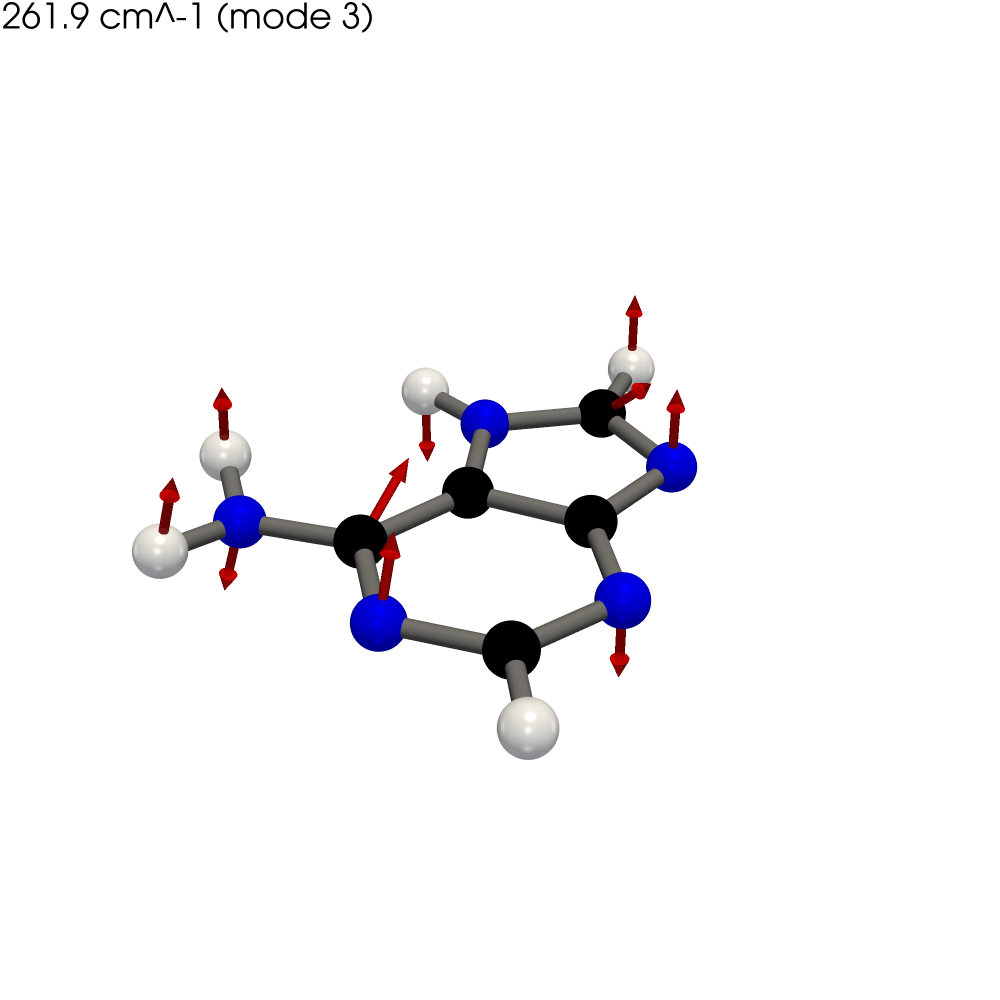

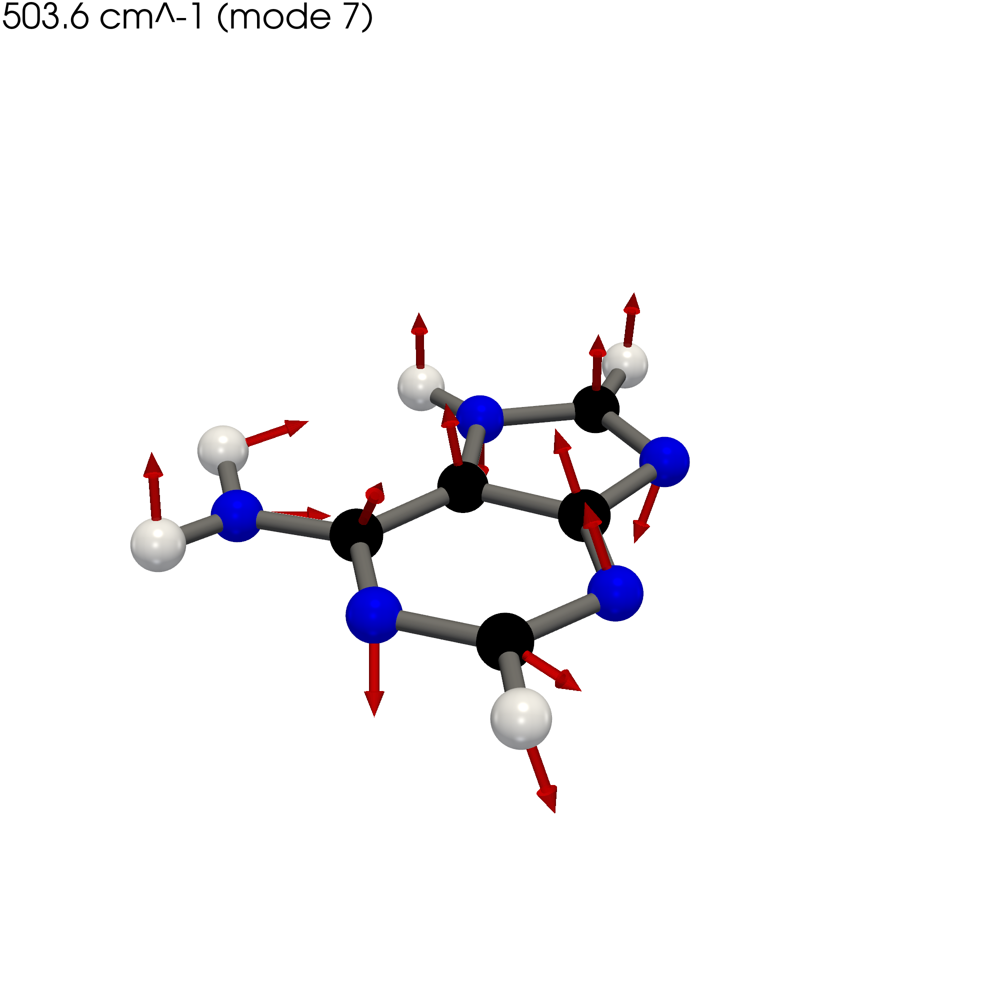

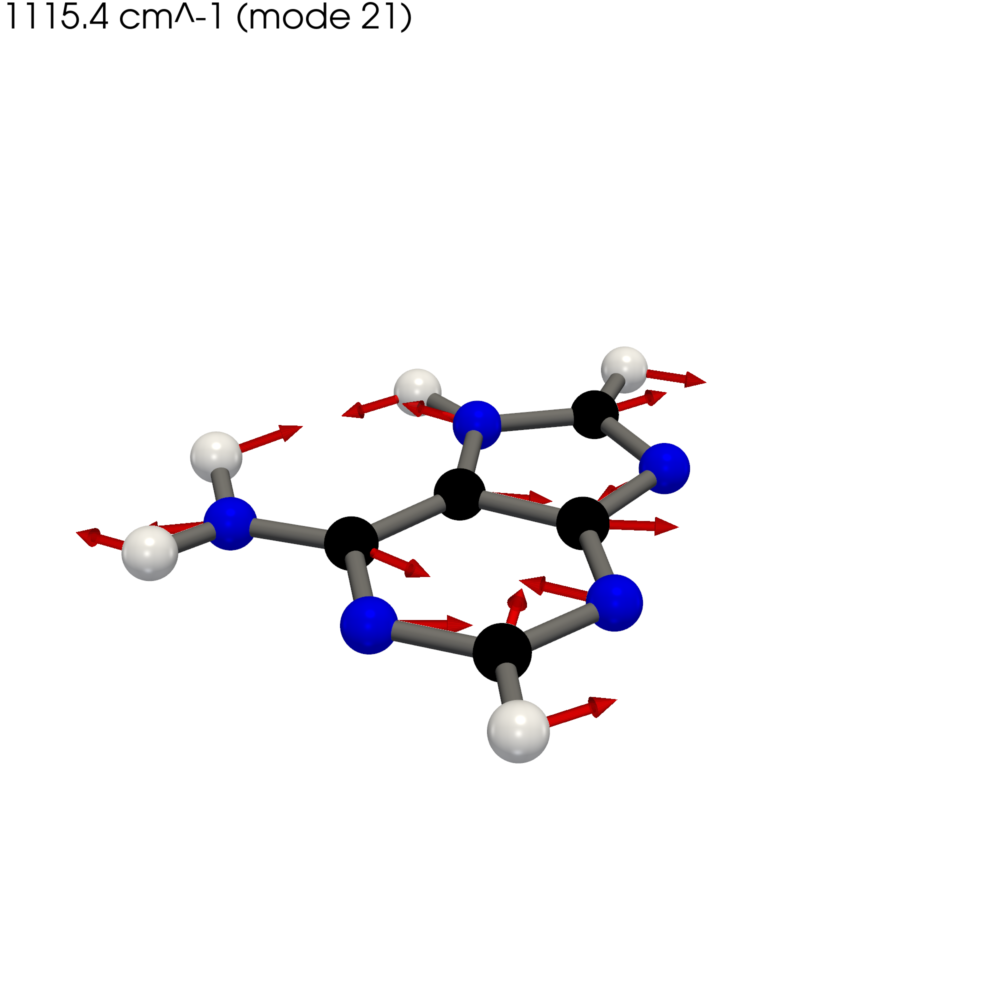

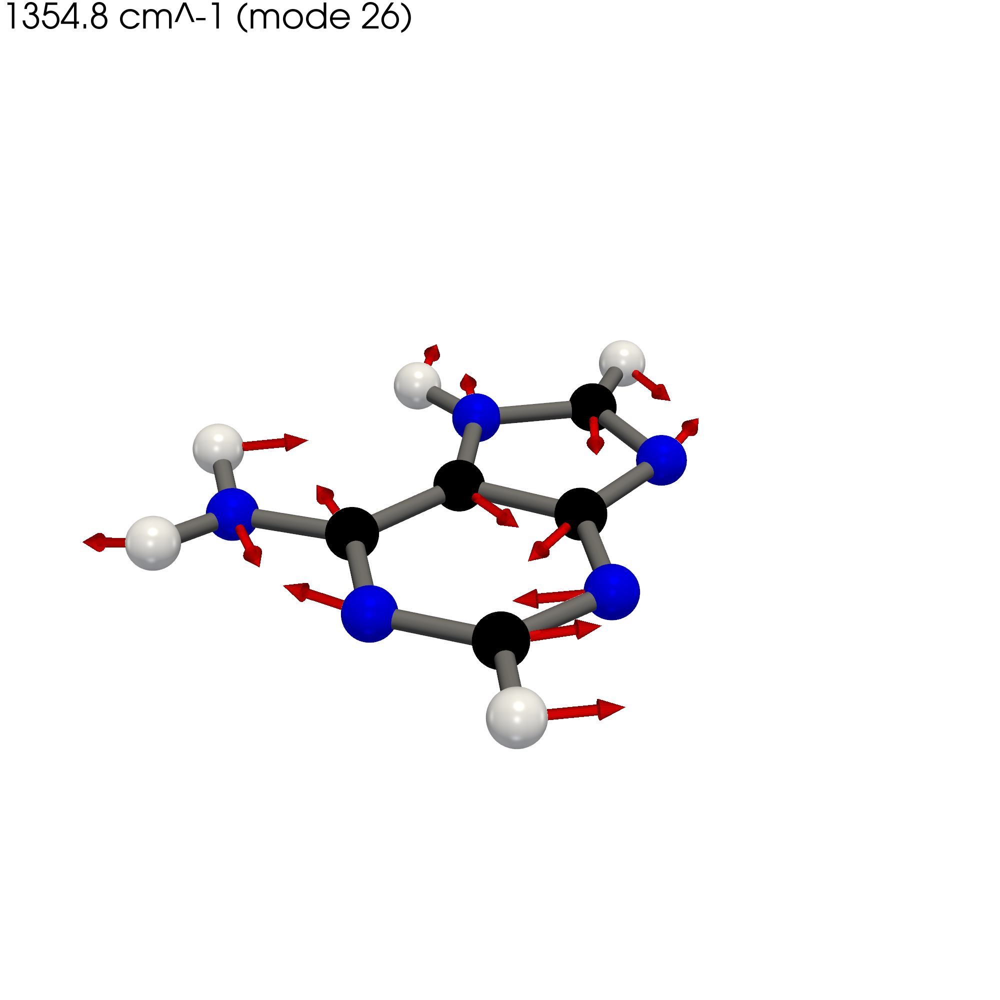

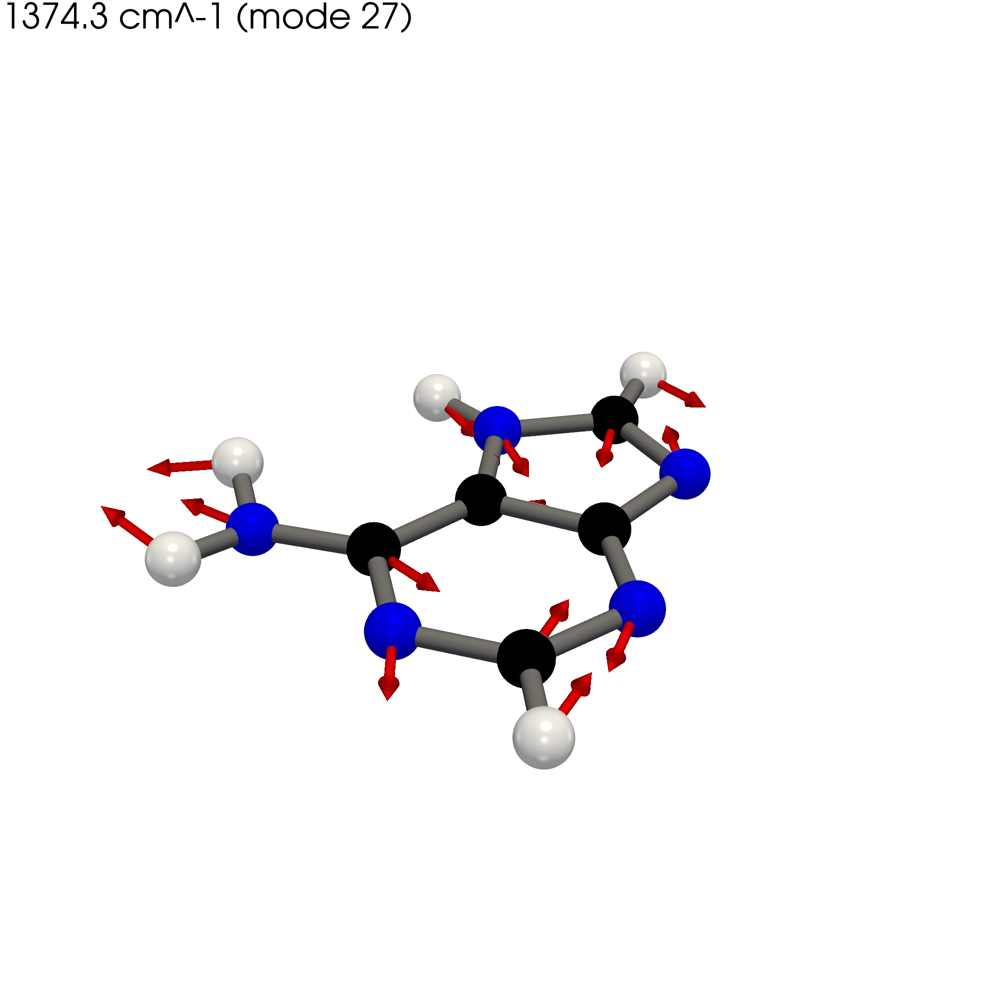

...

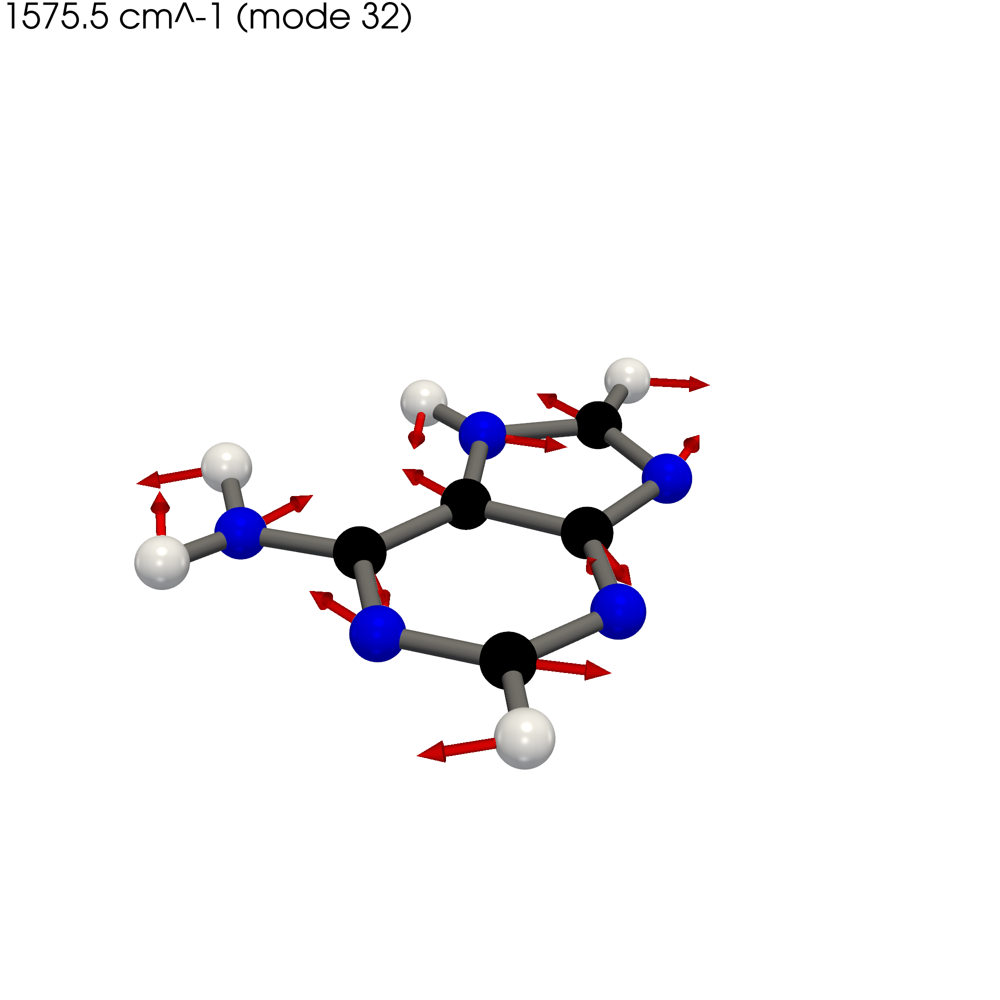

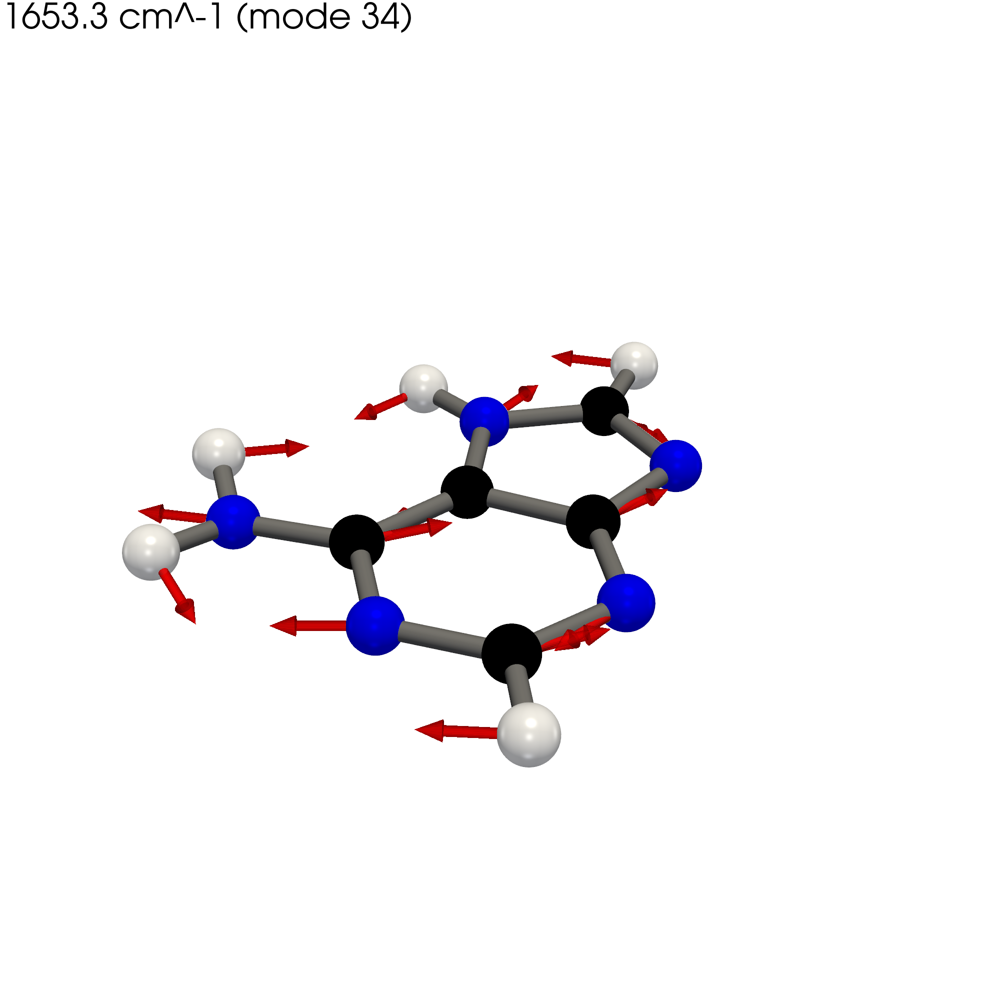

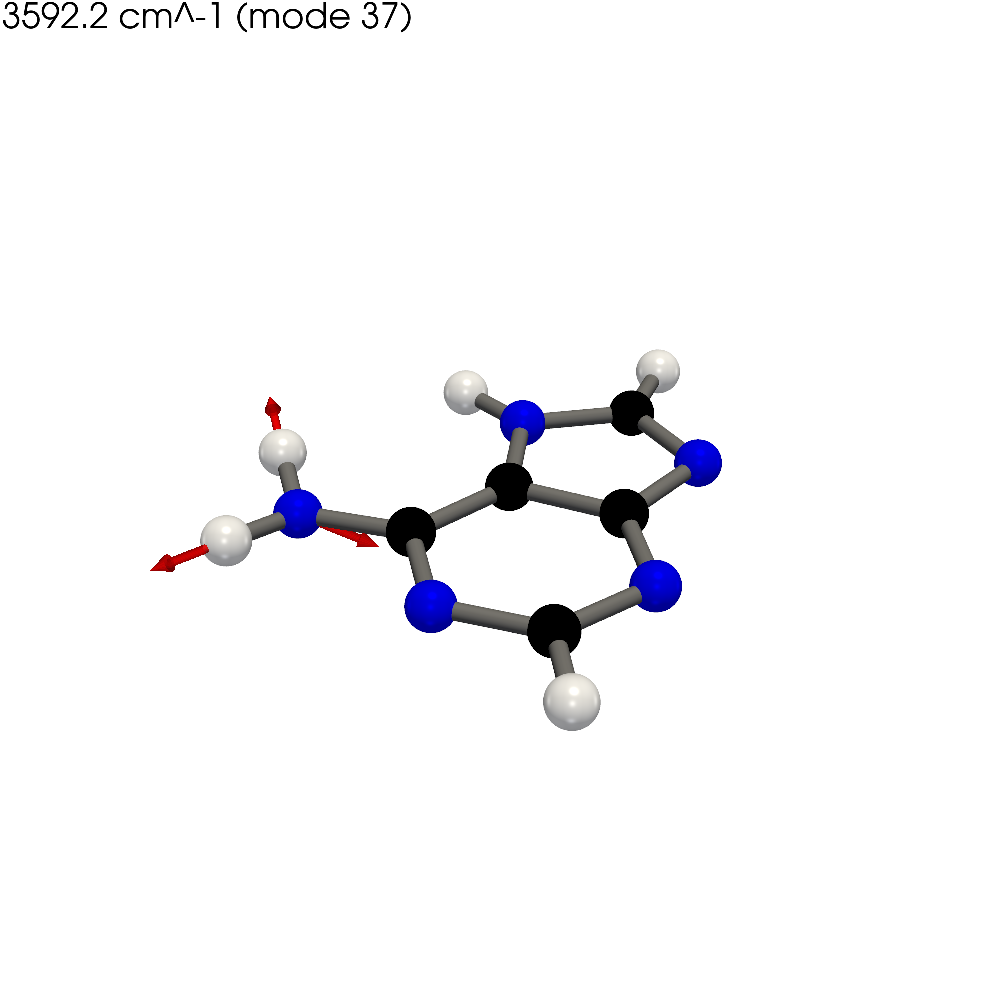

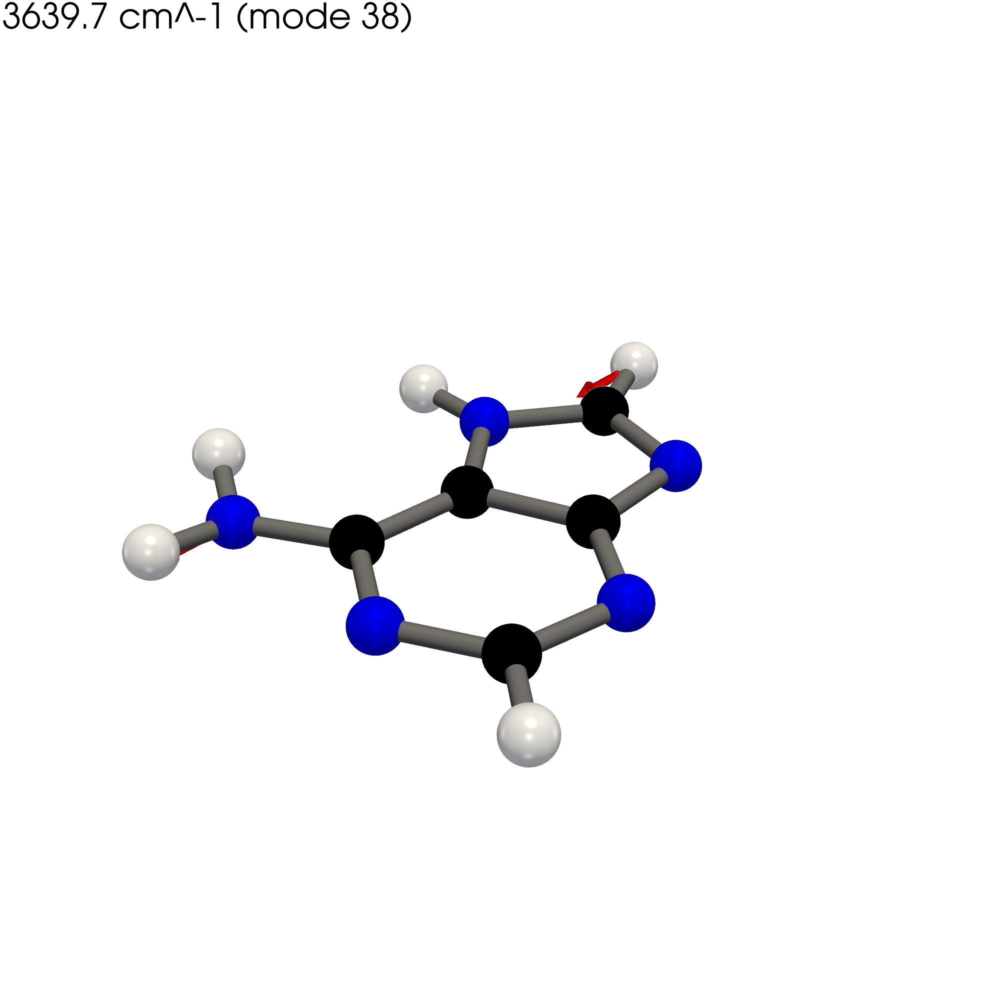

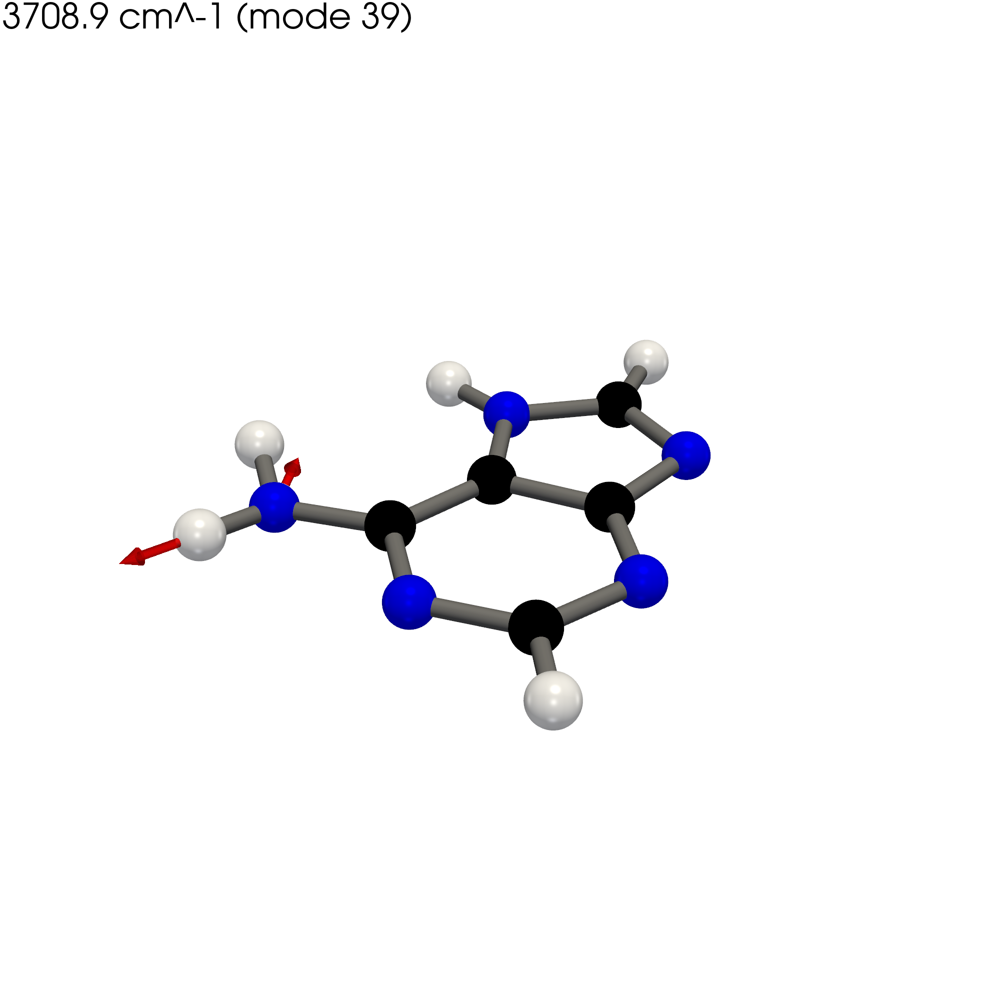

Rendered 14 PNGs -> /Users/ishaanmadan/fun_repos/molecular-vibration-png-generator/test_figs


,source_log,png,mode_index,frequency_cm-1,ir_intensity_km/mol,reduced_mass_amu,is_imaginary,n_atoms,geometry_frame,rendered
0,adenine_pcm_water.log,/Users/ishaanmadan/fun_repos/molecular-vibrati...,3,261.8677,383.9988,1.2957,False,15,standard,True
1,adenine_pcm_water.log,/Users/ishaanmadan/fun_repos/molecular-vibrati...,7,503.6129,176.2463,1.3994,False,15,standard,True
2,adenine_pcm_water.log,/Users/ishaanmadan/fun_repos/molecular-vibrati...,21,1115.3523,75.2021,2.1207,False,15,standard,True
3,adenine_pcm_water.log,/Users/ishaanmadan/fun_repos/molecular-vibrati...,26,1354.7738,50.0427,2.3758,False,15,standard,True
4,adenine_pcm_water.log,/Users/ishaanmadan/fun_repos/molecular-vibrati...,27,1374.3055,63.9896,5.9091,False,15,standard,True
5,adenine_pcm_water.log,/Users/ishaanmadan/fun_repos/molecular-vibrati...,28,1396.4213,182.6700,3.2992,False,15,standard,True
6,adenine_pcm_water.log,/Users/ishaanmadan/fun_repos/molecular-vibrati...,29,1441.4151,399.0798,2.4432,False,15,standard,True
7,adenine_pcm_water.log,/Users/ishaanmadan/fun_repos/molecular-vibrati...,30,1506.0360,72.3041,2.4184,False,15,standard,True
8,adenine_pcm_water.log,/Users/ishaanmadan/fun_repos/molecular-vibrati...,31,1518.1174,54.2545,3.2839,False,15,standard,True
9,adenine_pcm_water.log,/Users/ishaanmadan/fun_repos/molecular-vibrati...,32,1575.4521,268.2561,8.0755,False,15,standard,True


In [5]:
manifest_a = render_file(ADENINE, outdir=OUTDIR, ir_threshold=50.0)
manifest_a.to_csv(OUTDIR / "adenine_manifest.csv", index=False)

assert len(manifest_a) > 0
assert all(Path(p).exists() and Path(p).stat().st_size > 0 for p in manifest_a["png"])
print(f"Rendered {len(manifest_a)} PNGs -> {OUTDIR}")
manifest_a

### Preview the strongest band inline

mode 34: 1653.3 cm^-1, IR=879.8 KM/mol


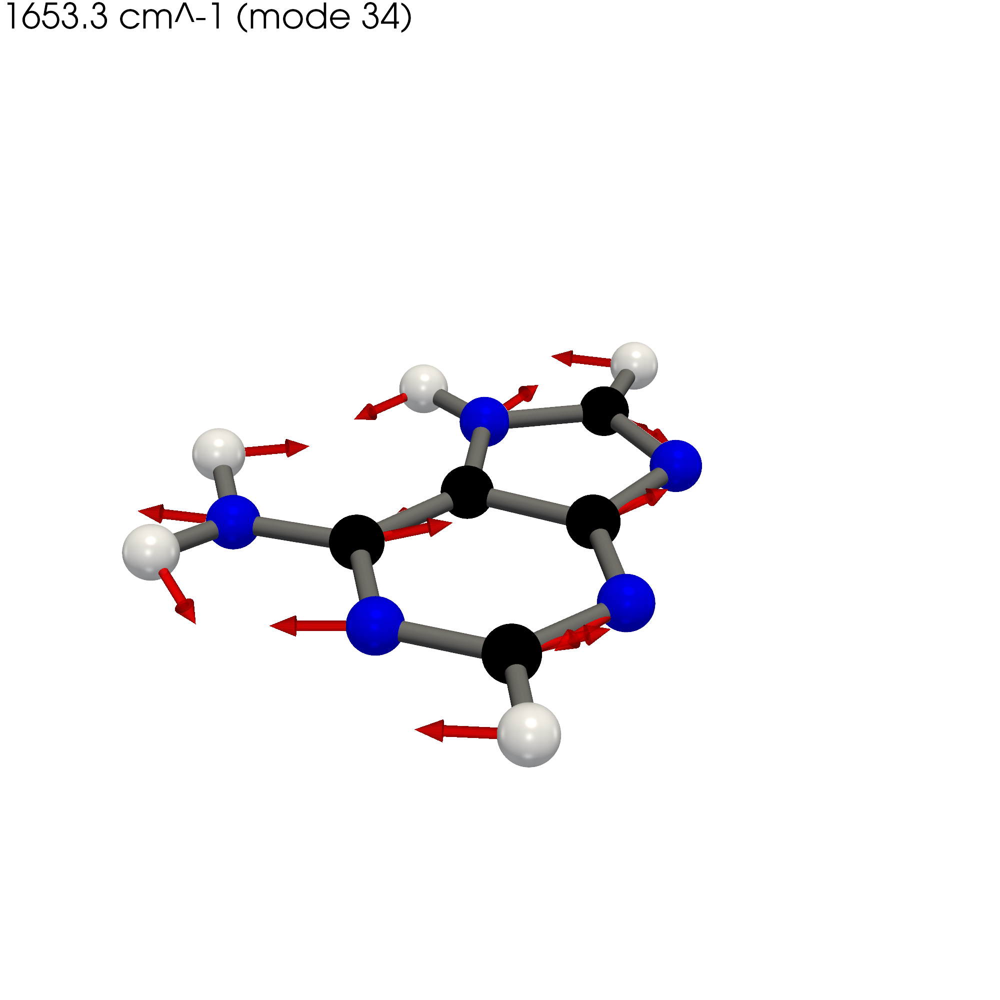

In [6]:
top = manifest_a.loc[manifest_a["ir_intensity_km/mol"].idxmax()]
print(f"mode {int(top['mode_index'])}: {top['frequency_cm-1']:.1f} cm^-1, "
      f"IR={top['ir_intensity_km/mol']:.1f} KM/mol")
Image(filename=top["png"], width=500)

## 2. Negative case — H2SO4 transition state (saddle point)

A first-order saddle point has **exactly one** imaginary frequency (Gaussian prints it as
negative). This is the diagnostic your validation workflow cares about: the tool must
(a) parse the log, (b) flag the imaginary mode, and (c) still render it even though its IR
intensity may be low, because `include_imaginary=True` (the default).

In [7]:
geom_s, modes_s = read_gaussian_log(H2SO4_TS)
imag = [m for m in modes_s if m.is_imaginary]

assert geom_s.n_atoms == 7,  f"expected 7 atoms, got {geom_s.n_atoms}"
assert len(modes_s) == 15,   f"expected 15 modes, got {len(modes_s)}"
assert len(imag) == 1,       f"a saddle point must have exactly 1 imaginary mode, got {len(imag)}"
assert imag[0].frequency < 0, imag[0].frequency

print(f"OK  {geom_s.n_atoms} atoms ({''.join(geom_s.symbols)}) | {len(modes_s)} modes")
print(f"    imaginary mode: #{imag[0].index} @ {imag[0].frequency:.2f} cm^-1 "
      f"(IR={imag[0].ir_intensity:.1f})")
modes_to_df(modes_s).head(6)

OK  7 atoms (SOOOHOH) | 15 modes
    imaginary mode: #1 @ -82.32 cm^-1 (IR=54.6)


,mode,freq_cm-1,IR_km/mol,red_mass_amu,imaginary
0,1,-82.3165,54.5787,1.2451,True
1,2,310.9720,116.3849,1.6204,False
2,3,338.9247,41.0135,2.6380,False
3,4,388.3713,30.8482,4.2259,False
4,5,464.4440,11.5521,4.4384,False
5,6,505.5353,31.2194,15.5096,False


### Render — confirm the imaginary mode survives selection

Even with `ir_threshold=50`, the negative-frequency mode is retained. Its arrows trace the
reaction coordinate through the transition state.

/Users/ishaanmadan/fun_repos/molecular-vibration-png-generator/molvib/render.py:126: UserWarning: Using static image for notebook display.
Install trame for interactive backends: pip install "pyvista[jupyter]"
  plot.show(auto_close=False)


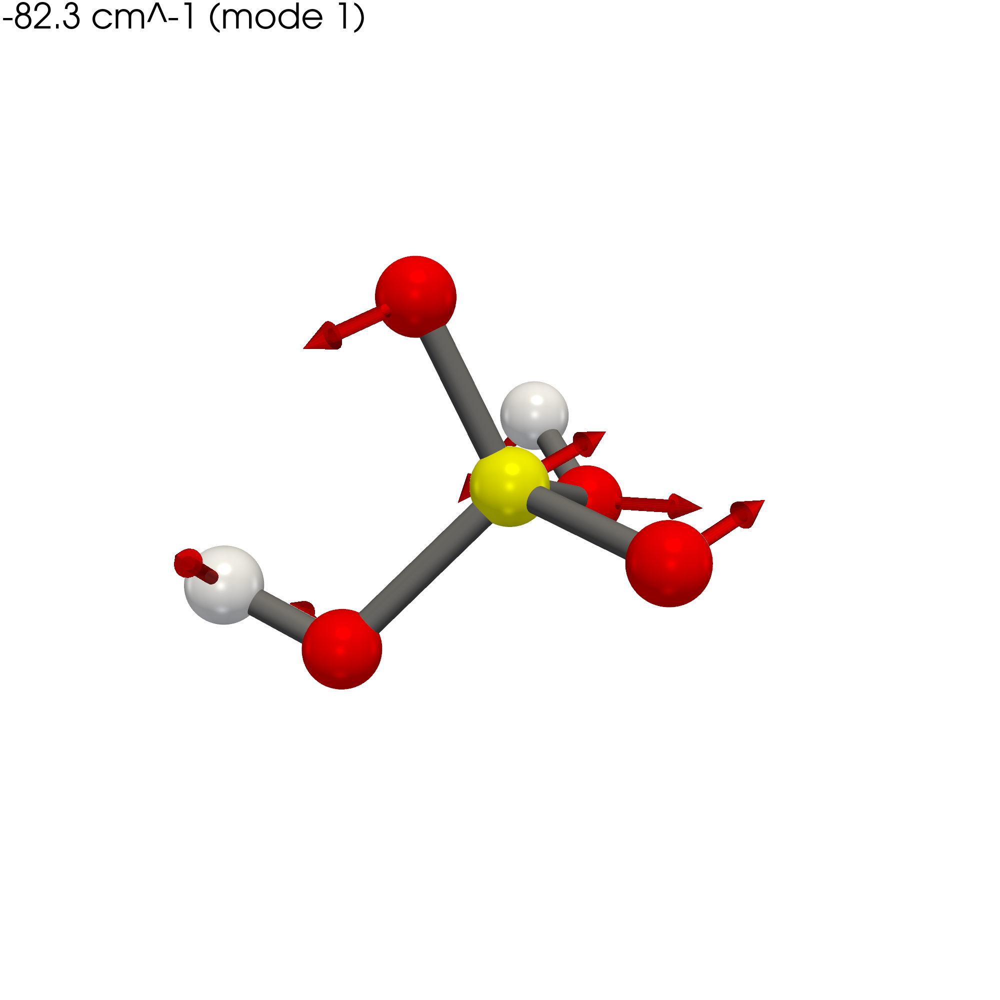

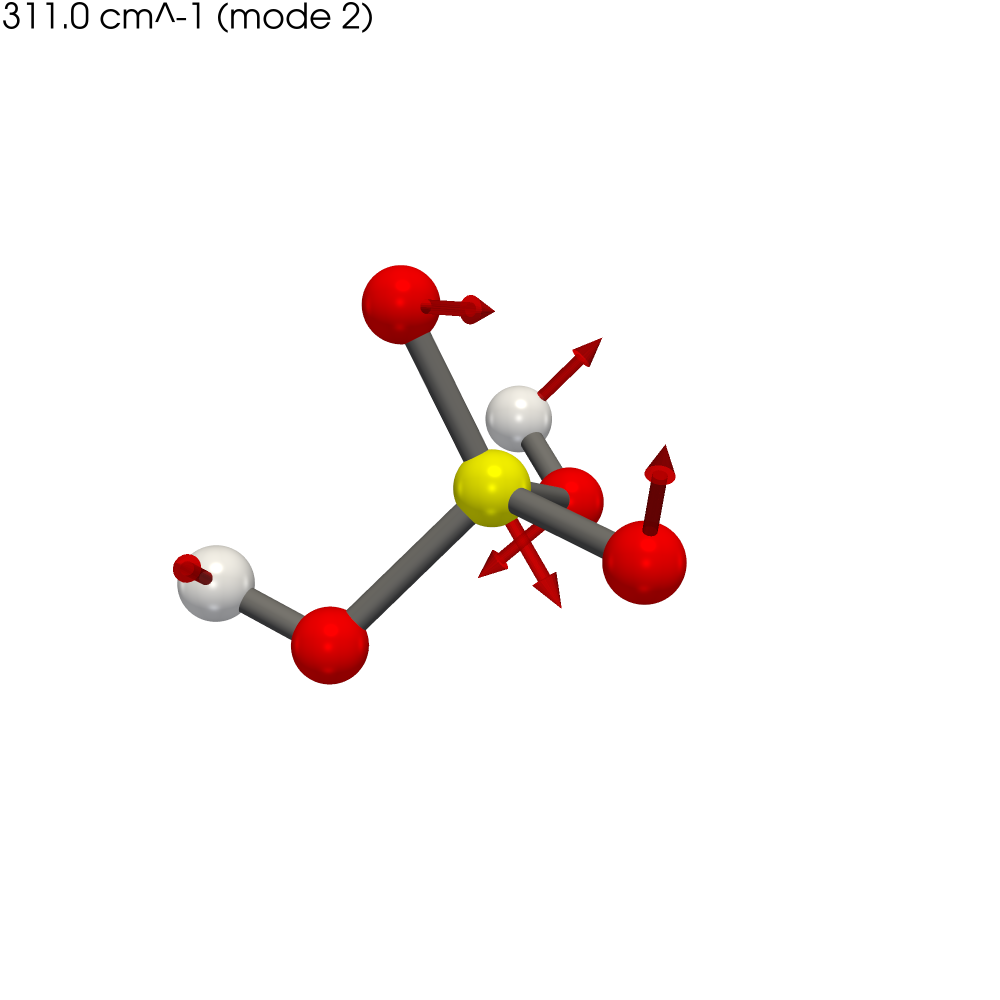

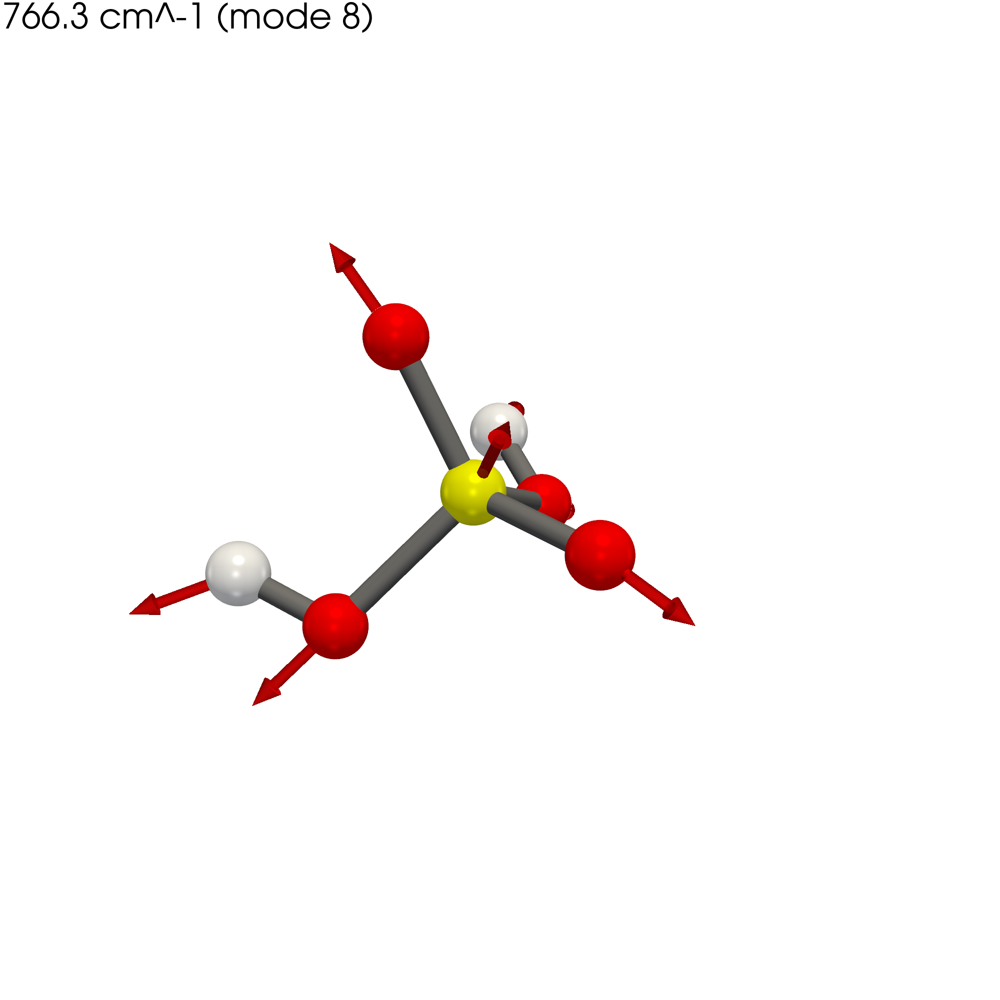

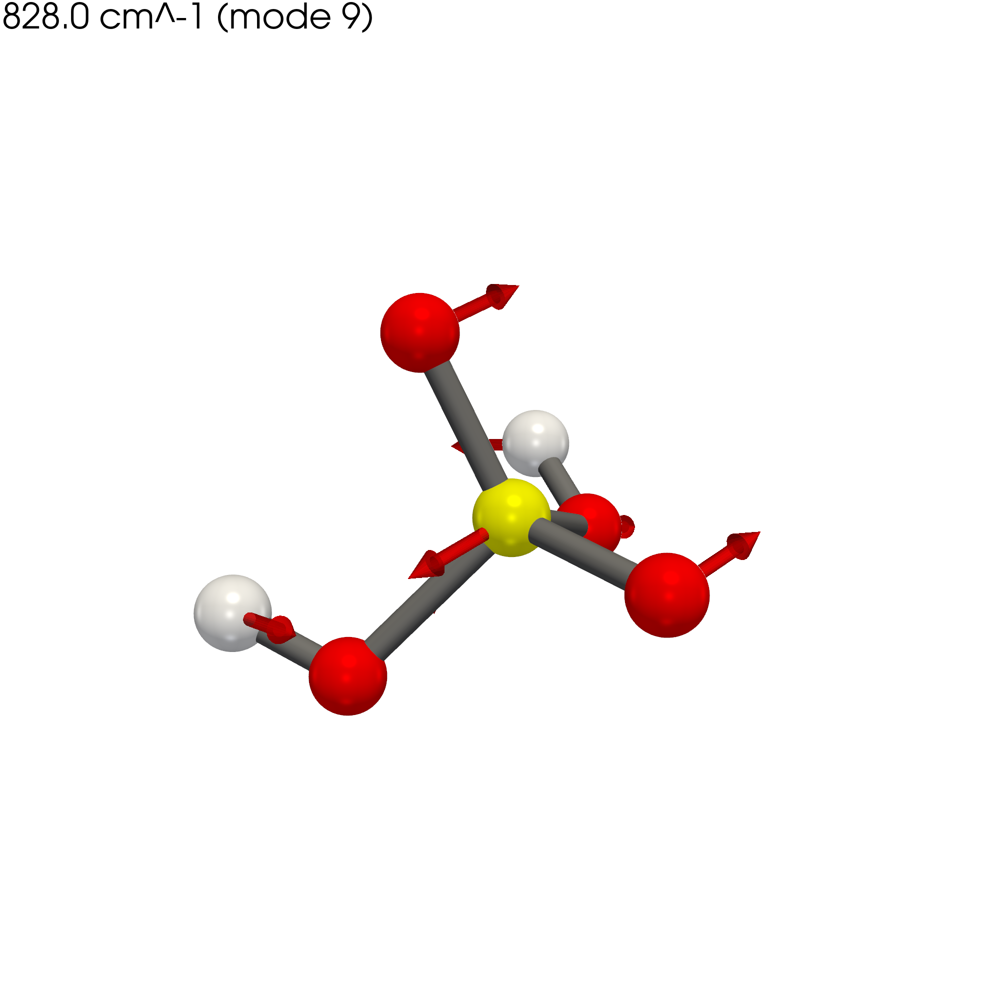

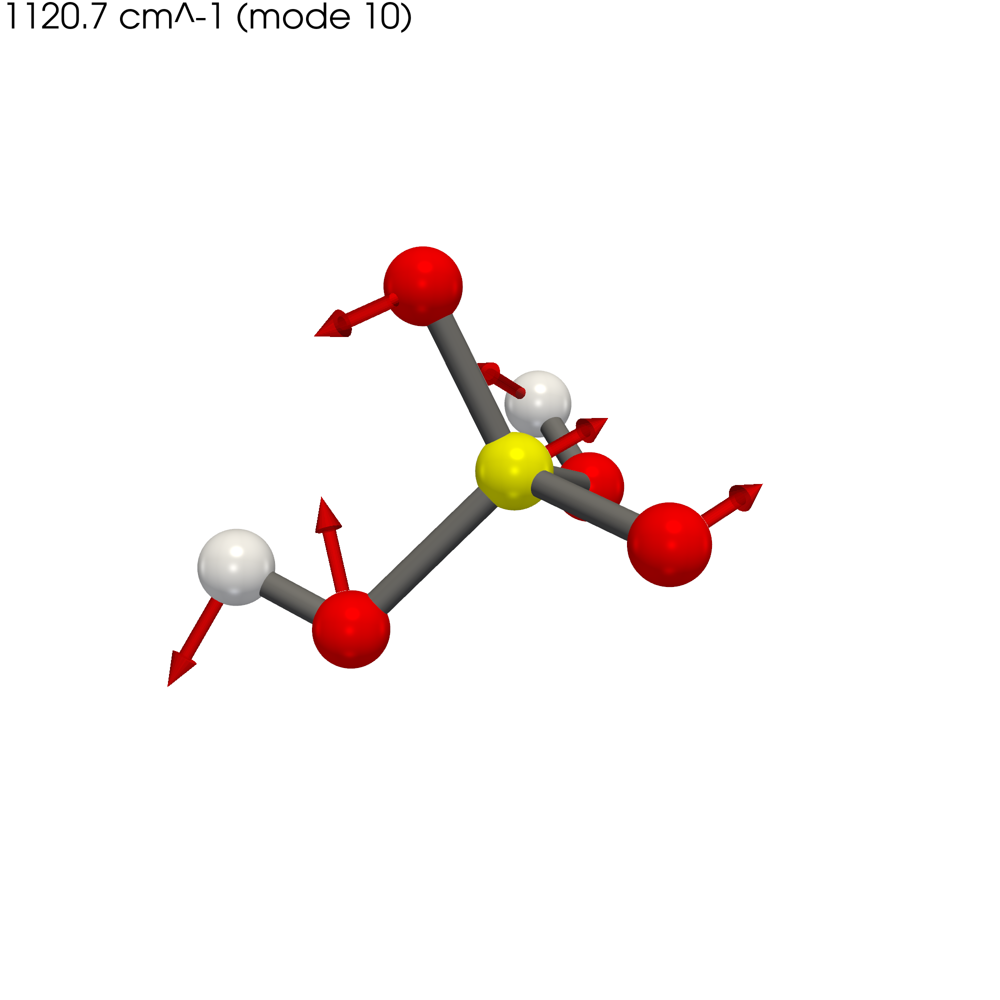

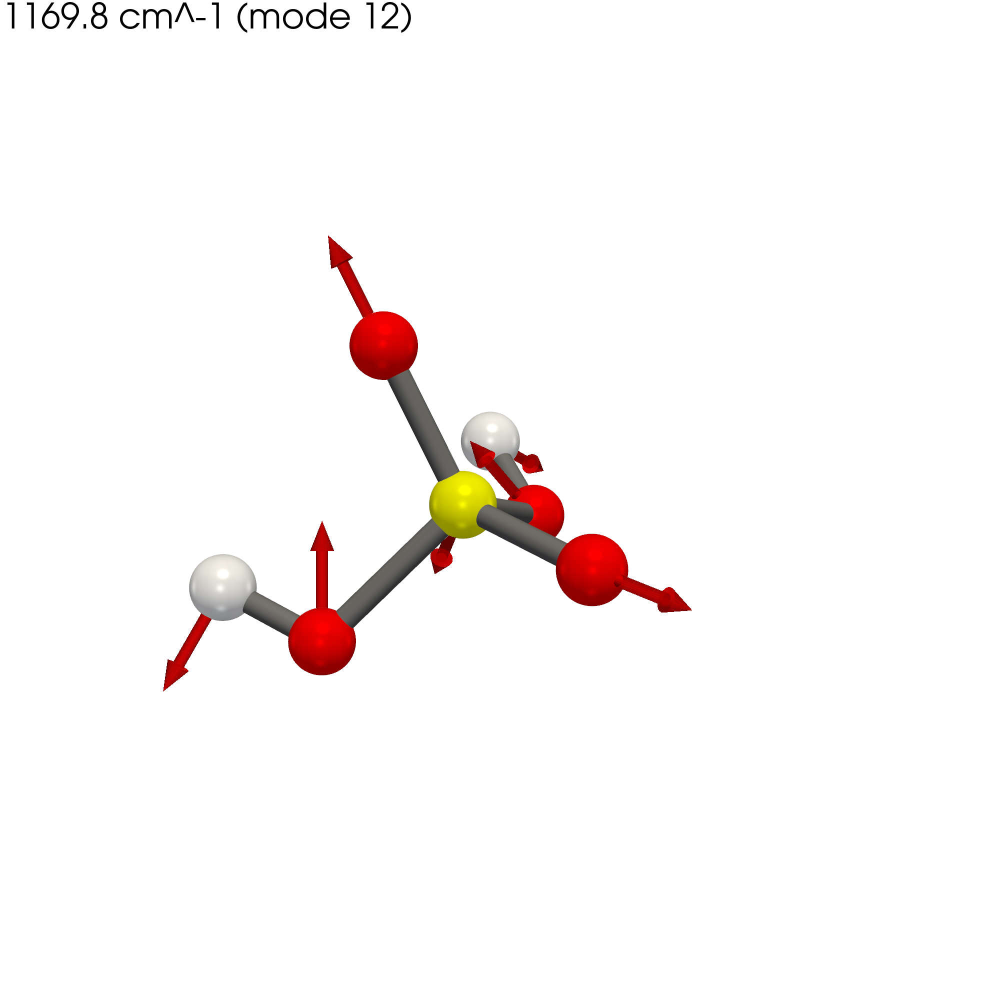

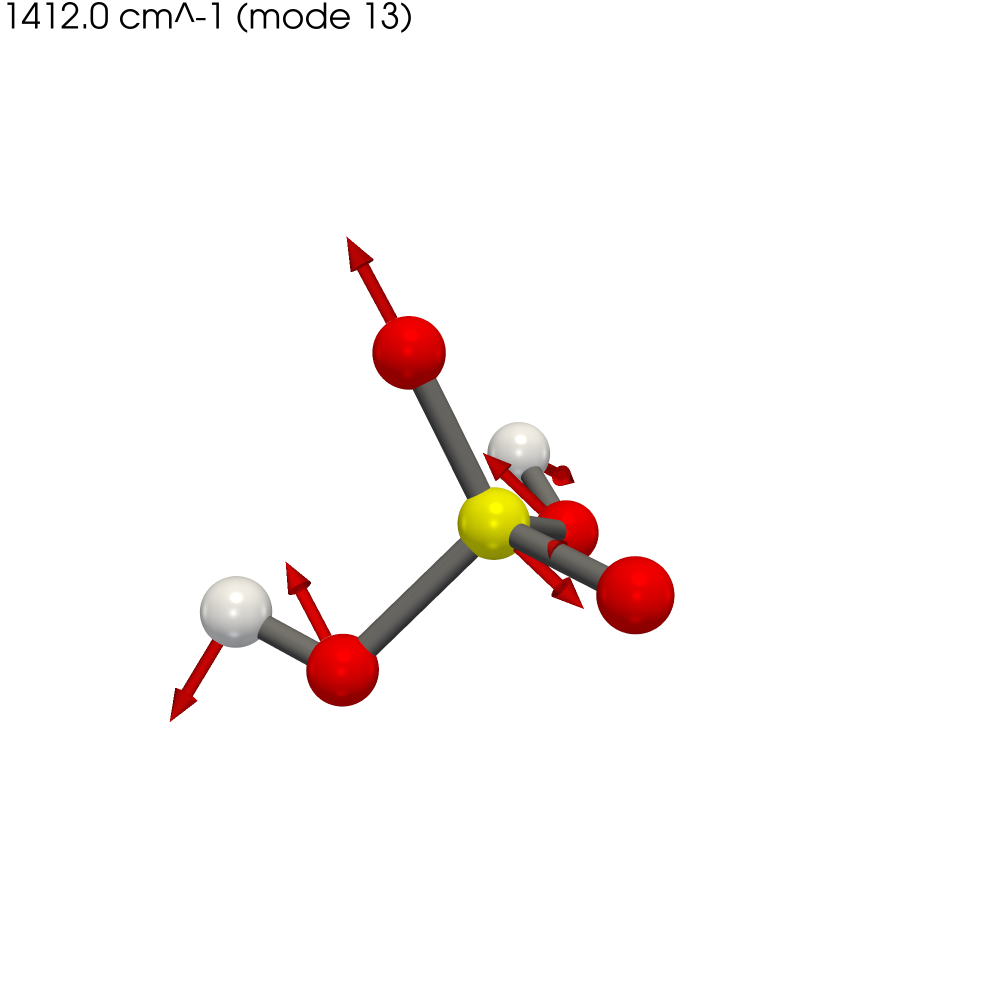

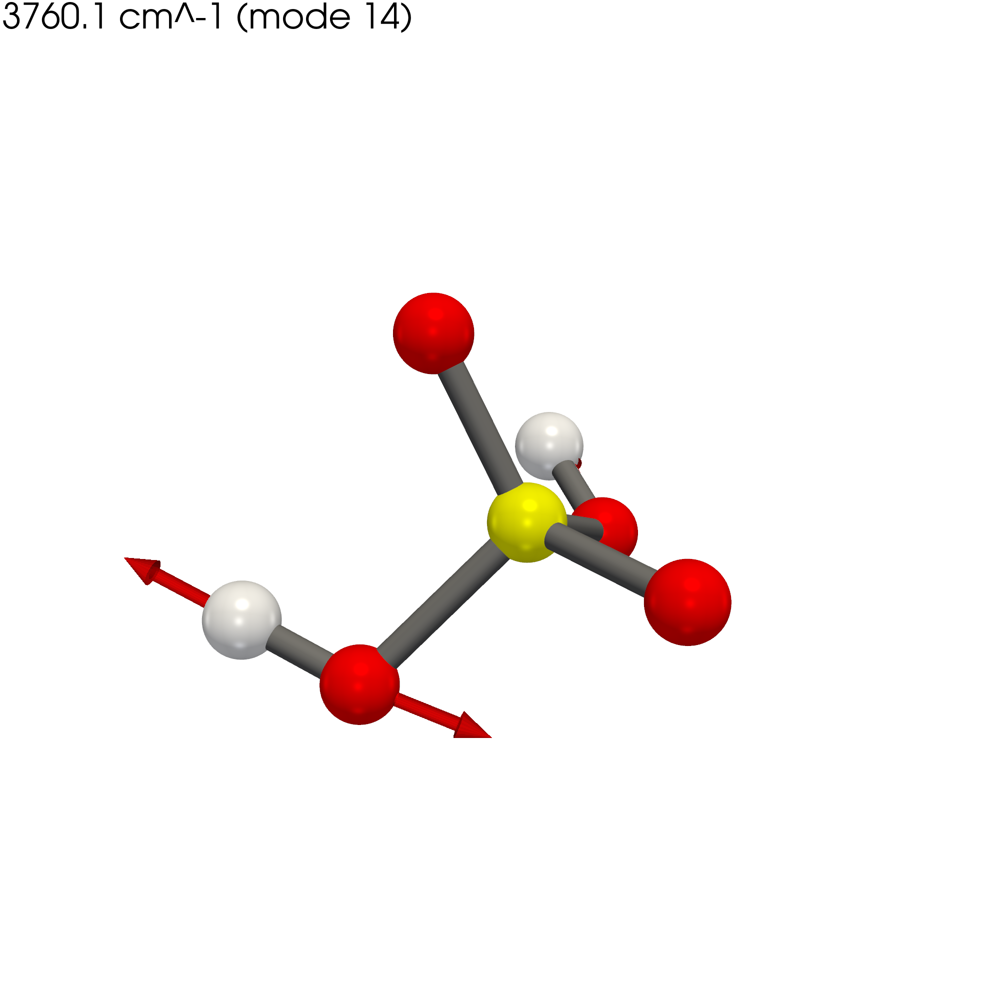

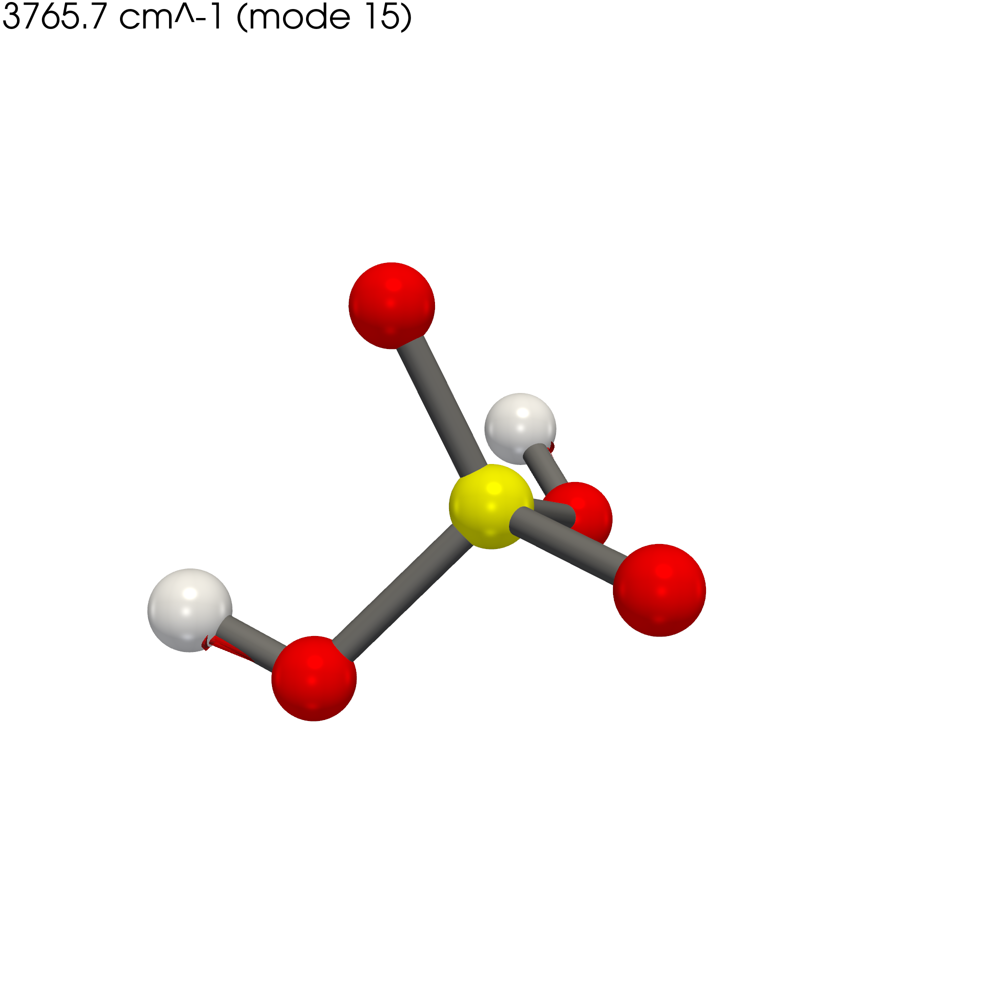

imaginary-mode PNG: neg_test_H2SO4_V_freq_mode001_-82.3cm.png


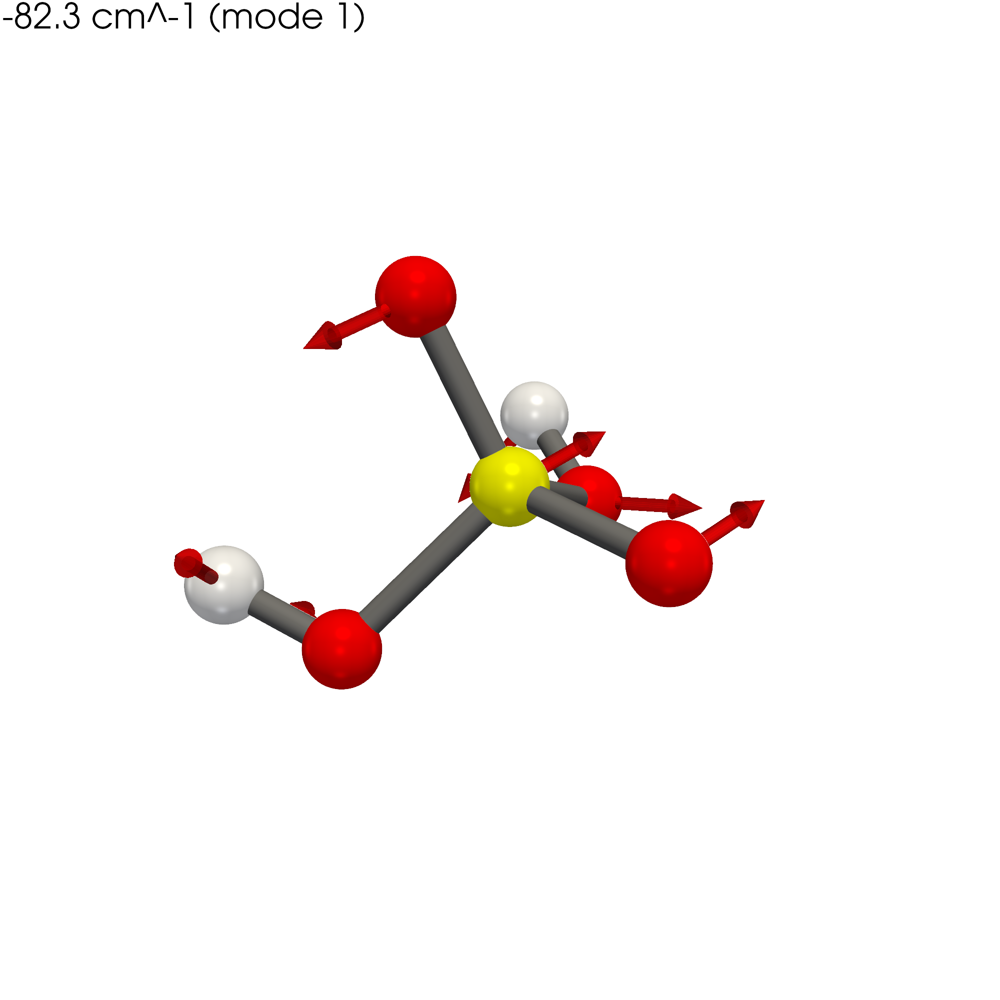

In [8]:
imag_idx = imag[0].index
manifest_s = render_file(H2SO4_TS, outdir=OUTDIR, ir_threshold=50.0, include_imaginary=True)
manifest_s.to_csv(OUTDIR / "h2so4_ts_manifest.csv", index=False)

assert (manifest_s["is_imaginary"]).any(), "imaginary mode must appear in the manifest"
assert imag_idx in set(manifest_s["mode_index"]), "imaginary mode must be rendered"

ts_png = manifest_s.loc[manifest_s["is_imaginary"], "png"].iloc[0]
print(f"imaginary-mode PNG: {Path(ts_png).name}")
Image(filename=ts_png, width=500)

### Control: dropping imaginary modes

The imaginary mode here happens to be IR-active (IR ~ 55 KM/mol), so it clears the 50-KM/mol
threshold on its own merits. To isolate the effect of the flag, raise the threshold above its
intensity: with `include_imaginary=True` it is still kept; with `include_imaginary=False` it
disappears — confirming the flag governs the behavior.

In [9]:
HIGH = 100.0  # above the imaginary mode's IR intensity (~55 KM/mol)
kept = render_file(H2SO4_TS, outdir=OUTDIR, ir_threshold=HIGH,
                   include_imaginary=True, render=False)   # render=False: manifest only, fast
dropped = render_file(H2SO4_TS, outdir=OUTDIR, ir_threshold=HIGH,
                      include_imaginary=False, render=False)

assert imag_idx in set(kept["mode_index"]),        "include_imaginary=True must keep it"
assert imag_idx not in set(dropped["mode_index"]), "include_imaginary=False must drop it"
print(f"threshold={HIGH}: kept with flag ({len(kept)} modes), "
      f"dropped without flag ({len(dropped)} modes): OK")

threshold=100.0: kept with flag (7 modes), dropped without flag (6 modes): OK


## 3. Batch sanity check — a whole directory at once

`render_directory` globs `*.xyz`, `*.log`, `*.out`, routes parse failures to a separate
bad-logs frame, and returns one combined manifest you can scan for `is_imaginary == True`.

In [10]:
from molvib.cli import render_directory
manifest_all, bad = render_directory(LOGDIR, outdir=OUTDIR, ir_threshold=50.0, render=False)

print(f"{len(manifest_all)} selected modes across the logs in {LOGDIR.relative_to(REPO)}")
print("logs containing an imaginary mode:",
      list(manifest_all.loc[manifest_all['is_imaginary'], 'source_log'].unique()))
if len(bad):
    print("\nfiles that failed validation:")
    display(bad)
manifest_all[['source_log','mode_index','frequency_cm-1','ir_intensity_km/mol','is_imaginary']]

23 selected modes across the logs in molecular-vibration-png-generator
logs containing an imaginary mode: ['neg_test_H2SO4_V_freq.log']


,source_log,mode_index,frequency_cm-1,ir_intensity_km/mol,is_imaginary
0,adenine_pcm_water.log,3,261.8677,383.9988,False
1,adenine_pcm_water.log,7,503.6129,176.2463,False
2,adenine_pcm_water.log,21,1115.3523,75.2021,False
3,adenine_pcm_water.log,26,1354.7738,50.0427,False
4,adenine_pcm_water.log,27,1374.3055,63.9896,False
5,adenine_pcm_water.log,28,1396.4213,182.6700,False
6,adenine_pcm_water.log,29,1441.4151,399.0798,False
7,adenine_pcm_water.log,30,1506.0360,72.3041,False
8,adenine_pcm_water.log,31,1518.1174,54.2545,False
9,adenine_pcm_water.log,32,1575.4521,268.2561,False


## Result

If every cell ran without an `AssertionError`, the pipeline is validated on both a minimum
and a transition state:

- parsing + Z->symbol mapping + **standard-orientation frame matching**
- mode counting (3N-6) and imaginary-frequency detection
- IR-threshold selection, with `include_imaginary` controlling whether saddle-point modes are kept
- rendering + manifest generation, single-file and batch

PNGs and CSVs are in `test_figs/`. Delete that folder to reset.